In [ ]:
import os
import sys
import random
import keras
import warnings
import numpy as np
import pandas as pd
from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

import cv2 as cv
from glob import glob
import tensorflow as tf

# Data
from tensorflow.keras.utils import img_to_array, array_to_img

# Data Viz
import matplotlib.pyplot as plt

# Model
from keras import Sequential

from keras.models import Model, load_model
from keras.layers import Conv2D, Conv2DTranspose, InputLayer,AvgPool2D, Layer, Input, Dropout, MaxPool2D, concatenate,BatchNormalization, Activation, Add, Softmax, Lambda

from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint

import keras.backend as K

In [ ]:
path = '/content/drive/MyDrive/Cityscapes_dataset/cityscapes_data/train/'
image_paths = sorted(glob(path + "*.jpg"))
SIZE = 160
images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

for i in tqdm(range(len(image_paths))):
    path = image_paths[i]
    image = cv.imread(path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image = img_to_array(image).astype('float')
    img = image[:,:256,:]/255.0
    img = tf.image.resize(img,(SIZE, SIZE))
    mask = image[:,256:,:]/255.0
    mask = tf.image.resize(mask,(SIZE, SIZE))
    images[i] = img
    masks[i] = mask

100%|██████████| 2975/2975 [00:37<00:00, 78.97it/s] 


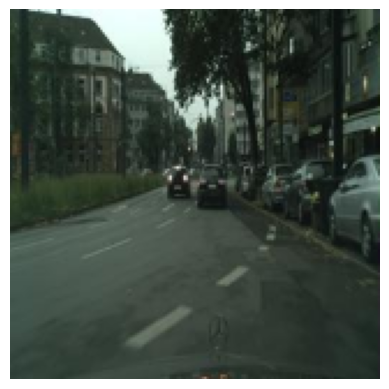

In [ ]:
plt.imshow(images[45])
plt.axis('off')
plt.show()


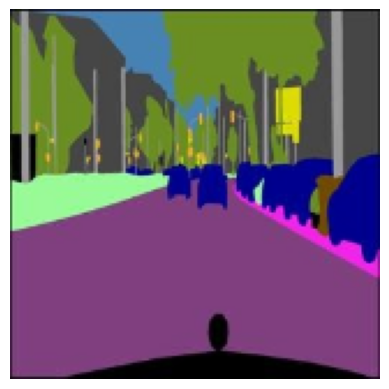

In [ ]:
plt.imshow(masks[45])
plt.axis('off')
plt.show()

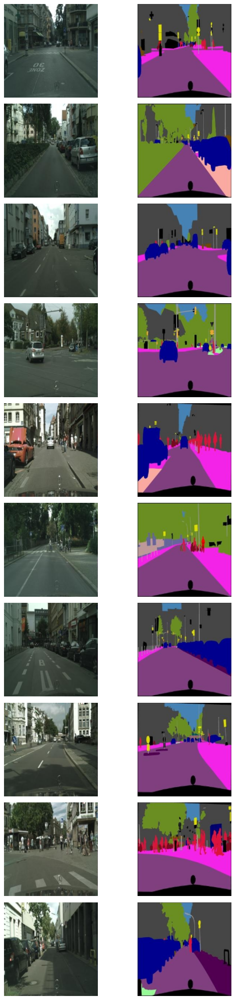

In [ ]:
plt.figure(figsize=(8,25))
for i in range(1,21):
  plt.subplot(10,2,i)
  if i%2!=0:
    id = np.random.randint(len(images))
    image = images[id]
    plt.imshow(image)
    plt.axis('off')
  elif i%2==0:
    mask = masks[id]
    plt.imshow(mask)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
X_train, y_train = images[:2900], masks[:2900]
X_valid, y_valid = images[2900:], masks[2900:]

#Unet

In [ ]:
# Encoder Layer Block
class EncoderLayerBlock(Layer):
  def __init__(self, filters, rate, pooling=True):
    super(EncoderLayerBlock, self).__init__()
    self.filters = filters
    self.rate = rate
    self.pooling = pooling

    self.c1 = Conv2D(self.filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
    self.drop = Dropout(self.rate)
    self.c2 = Conv2D(self.filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
    self.pool = MaxPool2D(pool_size=(2,2))

  def call(self, X):
    x = self.c1(X)
    x = self.drop(x)
    x = self.c2(x)
    if self.pooling:
      y = self.pool(x)
      return y, x
    else:
      return x

  def get_config(self):
    base_estimator = super().get_config()
    return {
        **base_estimator,
        "filters":self.filters,
        "rate":self.rate,
        "pooling":self.pooling
    }

#  Decoder Layer
class DecoderLayerBlock(Layer):
  def __init__(self, filters, rate, padding='same'):
    super(DecoderLayerBlock, self).__init__()
    self.filters = filters
    self.rate = rate
    self.cT = Conv2DTranspose(self.filters, kernel_size=3, strides=2, padding=padding)
    self.next = EncoderLayerBlock(self.filters, self.rate, pooling=False)

  def call(self, X):
    X, skip_X = X
    x = self.cT(X)
    c1 = concatenate([x, skip_X])
    y = self.next(c1)
    return y

  def get_config(self):
    base_estimator = super().get_config()
    return {
        **base_estimator,
        "filters":self.filters,
        "rate":self.rate,
    }

#  Callback
class ShowProgress(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    id = np.random.randint(len(X_valid))
    rand_img = X_valid[id][np.newaxis,...]
    pred_mask = self.model.predict(rand_img)[0]
    true_mask = y_valid[id]


    plt.subplot(1,3,1)
    plt.imshow(rand_img[0])
    plt.title("Original Image")
    plt.axis('off')


    plt.subplot(1,3,2)
    plt.imshow(pred_mask)
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(true_mask)
    plt.title("True Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
with tf.device('/GPU:0'):
    # Input Layer
    input_layer = Input(shape=X_train.shape[-3:])

    # Encoder
    p1, c1 = EncoderLayerBlock(16,0.1)(input_layer)
    p2, c2 = EncoderLayerBlock(32,0.1)(p1)
    p3, c3 = EncoderLayerBlock(64,0.2)(p2)
    p4, c4 = EncoderLayerBlock(128,0.2)(p3)

    # Encoding Layer
    c5 = EncoderLayerBlock(256,0.3,pooling=False)(p4)

    # Decoder
    d1 = DecoderLayerBlock(128,0.2)([c5, c4])
    d2 = DecoderLayerBlock(64,0.2)([d1, c3])
    d3 = DecoderLayerBlock(32,0.2)([d2, c2])
    d4 = DecoderLayerBlock(16,0.2)([d3, c1])

    # Output layer
    output = Conv2D(3,kernel_size=1,strides=1,padding='same',activation='sigmoid')(d4)

    # U-Net Model
    UnetModel = keras.models.Model(
        inputs=[input_layer],
        outputs=[output],
    )

    # Compiling
    UnetModel.compile(
        loss='binary_crossentropy',
        optimizer=Adam(learning_rate=0.001),
        metrics=['accuracy', keras.metrics.MeanIoU(num_classes=2)]
    )

    # Callbacks
    callbacks =[
        EarlyStopping(patience=5, restore_best_weights=True),
        ModelCheckpoint("UNet-Colorizer.h5", save_best_only=True),
        ShowProgress()
    ]


In [ ]:
# Train The Model
UnetModel.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs=50,
    callbacks=callbacks
)

In [ ]:
UnetModel.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 encoder_layer_block (EncoderLa  ((None, 80, 80, 16)  2768       ['input_1[0][0]']                
 yerBlock)                      , (None, 160, 160,                                                
                                16))                                                              
                                                                                                  
 encoder_layer_block_1 (Encoder  ((None, 40, 40, 32)  13888      ['encoder_layer_block[0][0]']

In [ ]:
path = '/content/drive/MyDrive/Cityscapes_dataset/cityscapes_data/val/'
image_paths = sorted(glob(path + "*.jpg"))
SIZE = 160
images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

for i in tqdm(range(len(image_paths))):
    path = image_paths[i]
    image = cv.imread(path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image = img_to_array(image).astype('float')
    img = image[:,:256,:]/255.0
    img = tf.image.resize(img,(SIZE, SIZE))
    mask = image[:,256:,:]/255.0
    mask = tf.image.resize(mask,(SIZE, SIZE))
    images[i] = img
    masks[i] = mask

100%|██████████| 500/500 [00:14<00:00, 35.31it/s]


In [ ]:
def show_image(image,title=None):
    plt.imshow(image)
    if title is not None: plt.title(title)
    plt.axis('off')

1/1 [==============================] - 0s 35ms/step


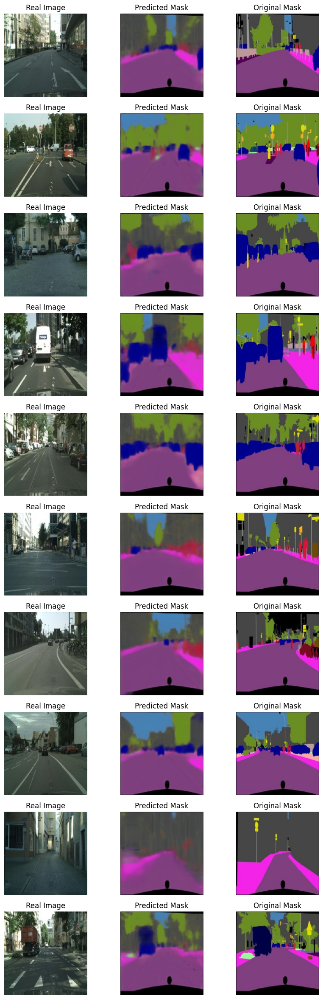

In [ ]:
plt.figure(figsize=(10,30))
n=0
for i in range(1,31):
    plt.subplot(10,3,i)
    if n==0:
        id = np.random.randint(len(images))
        real_img = images[id][np.newaxis,...]
        pred_mask = UnetModel.predict(real_img)[0]
        mask = masks[id]
        show_image(real_img[0], title="Real Image")
        n+=1
    elif n==1:
        show_image(pred_mask, title="Predicted Mask")
        n+=1
    elif n==2:
        show_image(mask, title="Original Mask")
        n=0
plt.show()

In [ ]:
UnetModel.load_weights('/content/UNet-Colorizer.h5')

#Linknet

In [ ]:
# Encoder Layer Block
class EncoderLayerBlock(Layer):
  def __init__(self, filters, rate, pooling=True):
    super(EncoderLayerBlock, self).__init__()
    self.filters = filters
    self.rate = rate
    self.pooling = pooling

    self.c1 = Conv2D(self.filters, kernel_size=3, padding='same', kernel_initializer='he_normal')
    self.bn1 = BatchNormalization()
    self.a1 = Activation('relu')
    self.c2 = Conv2D(self.filters, kernel_size=3, padding='same', kernel_initializer='he_normal')
    self.bn2 = BatchNormalization()
    self.a2 = Activation('relu')
    self.pool = MaxPool2D(pool_size=(2,2))

  def call(self, X):
    x = self.c1(X)
    x = self.bn1(x)
    x = self.a1(x)
    x = self.c2(x)
    x = self.bn2(x)
    x = self.a2(x)
    if self.pooling:
      y = self.pool(x)
      return y, x
    else:
      return x

  def get_config(self):
    base_estimator = super().get_config()
    return {
        **base_estimator,
        "filters":self.filters,
        "rate":self.rate,
        "pooling":self.pooling
    }

# Decoder Layer Block
class DecoderLayerBlock(Layer):
  def __init__(self, filters, rate, padding='same'):
    super(DecoderLayerBlock, self).__init__()
    self.filters = filters
    self.rate = rate
    self.cT = Conv2DTranspose(self.filters, kernel_size=3, strides=2, padding=padding)
    self.bnT = BatchNormalization()
    self.aT = Activation('relu')
    self.next = EncoderLayerBlock(self.filters, self.rate, pooling=False)

  def call(self, X):
    X, skip_X = X
    x = self.cT(X)
    x = self.bnT(x)
    x = self.aT(x)
    c1 = concatenate([x, skip_X])
    y = self.next(c1)
    return y

  def get_config(self):
    base_estimator = super().get_config()
    return {
        **base_estimator,
        "filters":self.filters,
        "rate":self.rate,
    }



In [ ]:
class ShowProgress(keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    id = np.random.randint(len(X_valid))
    rand_img = X_valid[id][np.newaxis,...]
    pred_mask = self.model.predict(rand_img)[0]
    true_mask = y_valid[id]


    plt.subplot(1,3,1)
    plt.imshow(rand_img[0])
    plt.title("Original Image")
    plt.axis('off')


    plt.subplot(1,3,2)
    plt.imshow(pred_mask)
    plt.title("Predicted Mask")
    plt.axis('off')

    plt.subplot(1,3,3)
    plt.imshow(true_mask)
    plt.title("True Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Định nghĩa mô hình LinkNet
with tf.device('/GPU:0'):
    # Input Layer
    input_layer = Input([160,160,3])

    # Encoder
    p1, c1 = EncoderLayerBlock(16, 0.1)(input_layer)
    p2, c2 = EncoderLayerBlock(32, 0.1)(p1)
    p3, c3 = EncoderLayerBlock(64, 0.2)(p2)
    p4, c4 = EncoderLayerBlock(128, 0.2)(p3)

    # Decoder
    d1 = DecoderLayerBlock(128, 0.2)([p4, c4])
    d2 = DecoderLayerBlock(64, 0.2)([d1, c3])
    d3 = DecoderLayerBlock(32, 0.2)([d2, c2])
    d4 = DecoderLayerBlock(16, 0.2)([d3, c1])

    # Output layer
    output = Conv2D(3, kernel_size=1, strides=1, padding='same', activation='sigmoid')(d4)

    # LinkNet Model
    LinknetModel = keras.models.Model(
        inputs=[input_layer],
        outputs=[output],
    )

    # Compiling
    LinknetModel.compile(
        loss='binary_crossentropy',
        optimizer=Adam(learning_rate=0.001),
        metrics=['accuracy', keras.metrics.MeanIoU(num_classes=10)]
    )

    # Callbacks
    callbacks =[
        EarlyStopping(patience=5, restore_best_weights=True),
        ModelCheckpoint("LinkNet-Colorizer.h5", save_best_only=True),
        ShowProgress()
    ]


In [ ]:
LinknetModel.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 encoder_layer_block_11 (Encode  ((None, 80, 80, 16)  2896       ['input_4[0][0]']                
 rLayerBlock)                   , (None, 160, 160,                                                
                                16))                                                              
                                                                                                  
 encoder_layer_block_12 (Encode  ((None, 40, 40, 32)  14144      ['encoder_layer_block_11[0]

Epoch 1/50
1/1 [==============================] - 1s 879ms/step


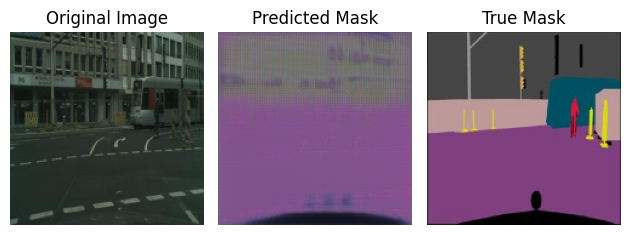

91/91 [==============================] - 52s 242ms/step - loss: 0.6085 - accuracy: 0.4804 - mean_io_u: 0.5000 - val_loss: 0.6391 - val_accuracy: 0.3020 - val_mean_io_u: 0.5000
Epoch 2/50
1/1 [==============================] - 0s 23ms/step


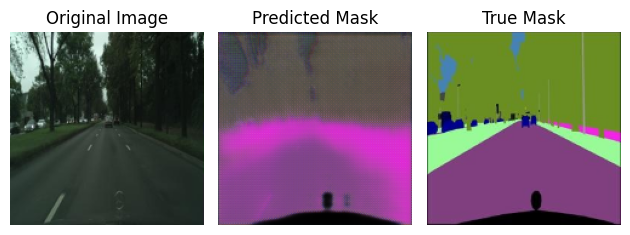

91/91 [==============================] - 16s 176ms/step - loss: 0.5752 - accuracy: 0.6006 - mean_io_u: 0.5000 - val_loss: 0.6361 - val_accuracy: 0.3485 - val_mean_io_u: 0.5000
Epoch 3/50
1/1 [==============================] - 0s 20ms/step


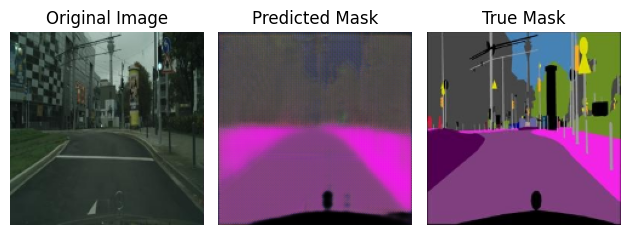

91/91 [==============================] - 16s 172ms/step - loss: 0.5686 - accuracy: 0.6339 - mean_io_u: 0.5000 - val_loss: 0.6126 - val_accuracy: 0.4898 - val_mean_io_u: 0.5000
Epoch 4/50
1/1 [==============================] - 0s 41ms/step


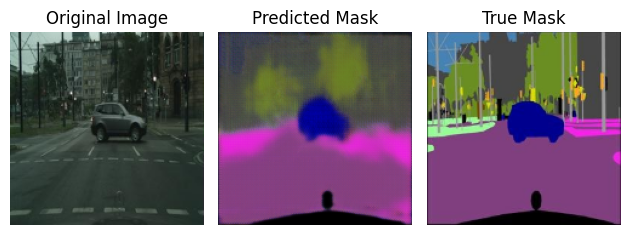

91/91 [==============================] - 16s 175ms/step - loss: 0.5654 - accuracy: 0.6359 - mean_io_u: 0.5000 - val_loss: 0.6061 - val_accuracy: 0.6532 - val_mean_io_u: 0.5000
Epoch 5/50
1/1 [==============================] - 0s 34ms/step


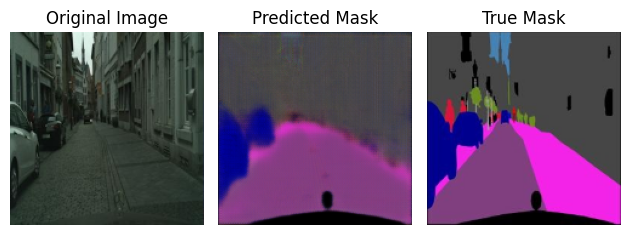

91/91 [==============================] - 16s 178ms/step - loss: 0.5635 - accuracy: 0.6267 - mean_io_u: 0.5000 - val_loss: 0.5875 - val_accuracy: 0.6327 - val_mean_io_u: 0.5000
Epoch 6/50
1/1 [==============================] - 0s 21ms/step


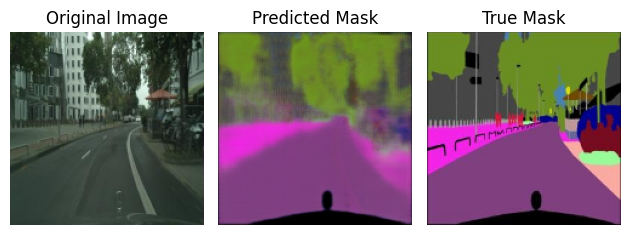

91/91 [==============================] - 16s 176ms/step - loss: 0.5609 - accuracy: 0.6464 - mean_io_u: 0.5000 - val_loss: 0.5826 - val_accuracy: 0.5763 - val_mean_io_u: 0.5000
Epoch 7/50
1/1 [==============================] - 0s 20ms/step


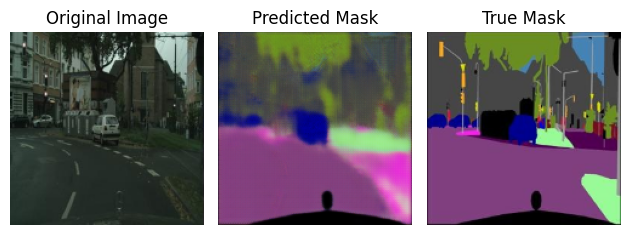

91/91 [==============================] - 16s 175ms/step - loss: 0.5599 - accuracy: 0.6442 - mean_io_u: 0.5000 - val_loss: 0.5789 - val_accuracy: 0.7057 - val_mean_io_u: 0.5000
Epoch 8/50
1/1 [==============================] - 0s 21ms/step


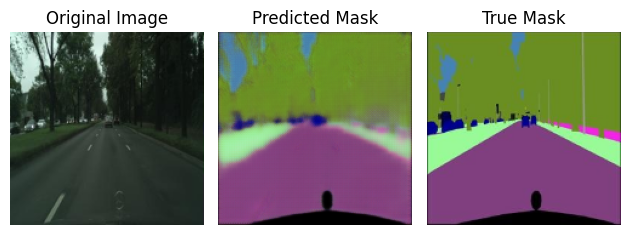

91/91 [==============================] - 16s 175ms/step - loss: 0.5588 - accuracy: 0.6439 - mean_io_u: 0.5000 - val_loss: 0.5762 - val_accuracy: 0.7103 - val_mean_io_u: 0.5000
Epoch 9/50
1/1 [==============================] - 0s 29ms/step


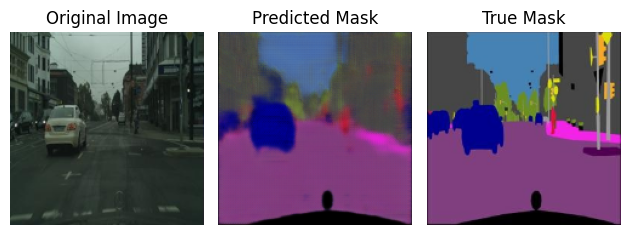

91/91 [==============================] - 16s 174ms/step - loss: 0.5573 - accuracy: 0.6469 - mean_io_u: 0.5000 - val_loss: 0.5777 - val_accuracy: 0.7288 - val_mean_io_u: 0.5000
Epoch 10/50
1/1 [==============================] - 0s 25ms/step


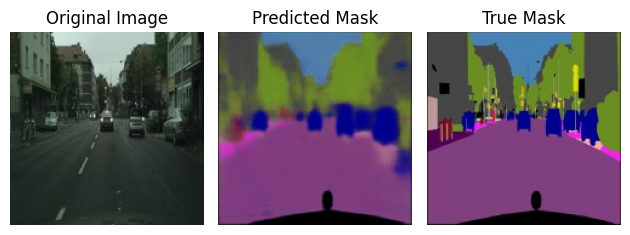

91/91 [==============================] - 16s 171ms/step - loss: 0.5564 - accuracy: 0.6538 - mean_io_u: 0.5000 - val_loss: 0.5763 - val_accuracy: 0.6576 - val_mean_io_u: 0.5000
Epoch 11/50
1/1 [==============================] - 0s 22ms/step


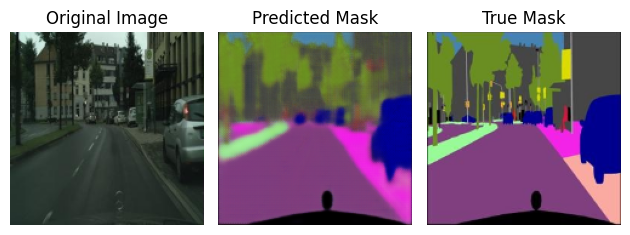

91/91 [==============================] - 16s 176ms/step - loss: 0.5556 - accuracy: 0.6422 - mean_io_u: 0.5000 - val_loss: 0.5754 - val_accuracy: 0.6809 - val_mean_io_u: 0.5000
Epoch 12/50
1/1 [==============================] - 0s 35ms/step


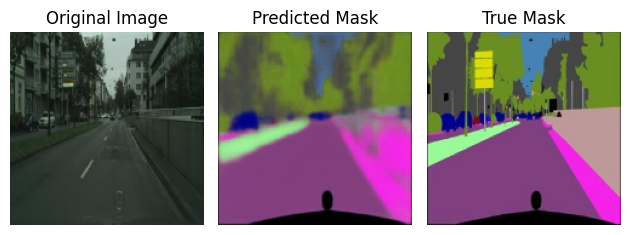

91/91 [==============================] - 16s 175ms/step - loss: 0.5545 - accuracy: 0.6534 - mean_io_u: 0.5000 - val_loss: 0.5789 - val_accuracy: 0.7159 - val_mean_io_u: 0.5000
Epoch 13/50
1/1 [==============================] - 0s 35ms/step


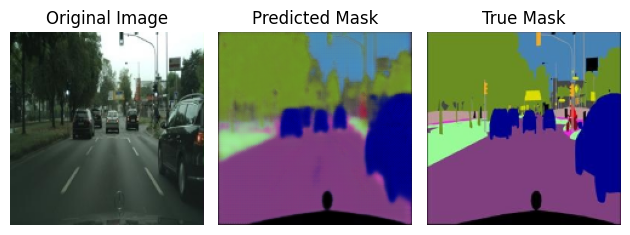

91/91 [==============================] - 16s 178ms/step - loss: 0.5540 - accuracy: 0.6508 - mean_io_u: 0.5000 - val_loss: 0.5750 - val_accuracy: 0.6622 - val_mean_io_u: 0.5000
Epoch 14/50
1/1 [==============================] - 0s 20ms/step


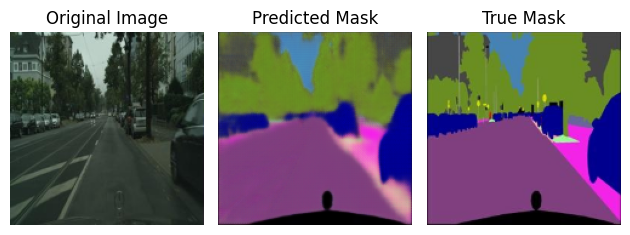

91/91 [==============================] - 16s 172ms/step - loss: 0.5530 - accuracy: 0.6550 - mean_io_u: 0.5000 - val_loss: 0.5757 - val_accuracy: 0.6536 - val_mean_io_u: 0.5000
Epoch 15/50
1/1 [==============================] - 0s 22ms/step


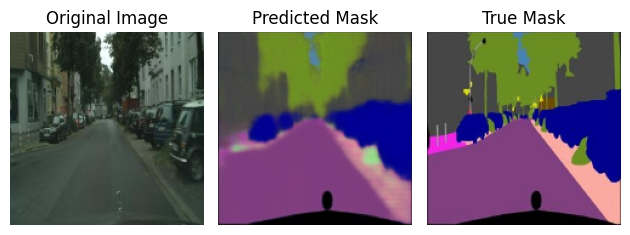

91/91 [==============================] - 16s 171ms/step - loss: 0.5526 - accuracy: 0.6364 - mean_io_u: 0.5000 - val_loss: 0.5763 - val_accuracy: 0.5833 - val_mean_io_u: 0.5000
Epoch 16/50
1/1 [==============================] - 0s 25ms/step


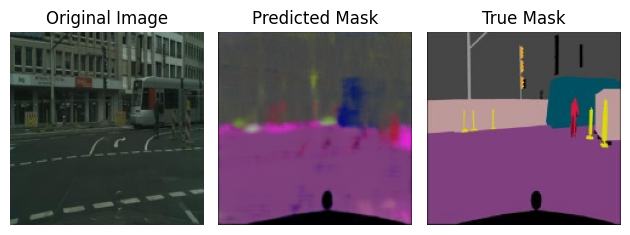

91/91 [==============================] - 16s 171ms/step - loss: 0.5512 - accuracy: 0.6526 - mean_io_u: 0.5000 - val_loss: 0.5751 - val_accuracy: 0.6802 - val_mean_io_u: 0.5000
Epoch 17/50
1/1 [==============================] - 0s 21ms/step


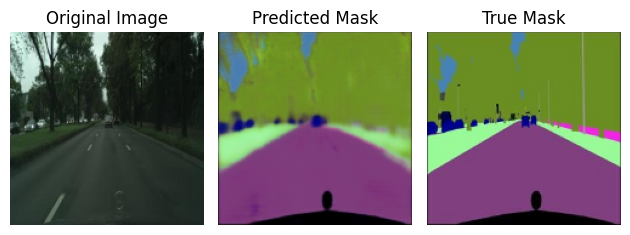

91/91 [==============================] - 16s 174ms/step - loss: 0.5503 - accuracy: 0.6471 - mean_io_u: 0.5000 - val_loss: 0.5749 - val_accuracy: 0.7210 - val_mean_io_u: 0.5000
Epoch 18/50
1/1 [==============================] - 0s 23ms/step


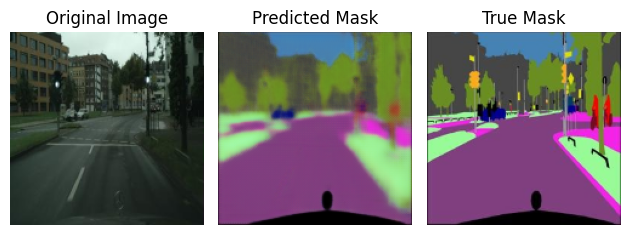

91/91 [==============================] - 16s 172ms/step - loss: 0.5498 - accuracy: 0.6541 - mean_io_u: 0.5000 - val_loss: 0.5751 - val_accuracy: 0.7120 - val_mean_io_u: 0.5000
Epoch 19/50
1/1 [==============================] - 0s 20ms/step


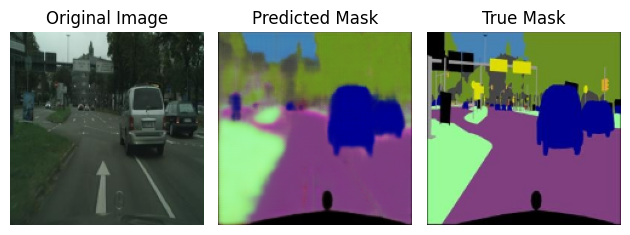

91/91 [==============================] - 16s 175ms/step - loss: 0.5493 - accuracy: 0.6601 - mean_io_u: 0.5000 - val_loss: 0.5738 - val_accuracy: 0.5433 - val_mean_io_u: 0.5000
Epoch 20/50
1/1 [==============================] - 0s 29ms/step


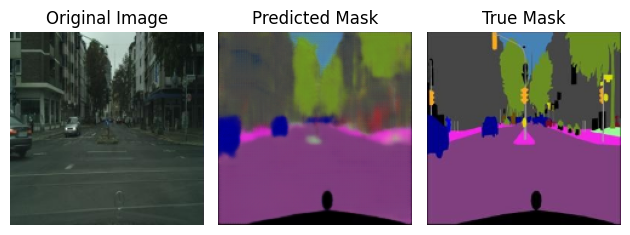

91/91 [==============================] - 16s 172ms/step - loss: 0.5487 - accuracy: 0.6467 - mean_io_u: 0.5000 - val_loss: 0.5772 - val_accuracy: 0.7034 - val_mean_io_u: 0.5000
Epoch 21/50
1/1 [==============================] - 0s 34ms/step


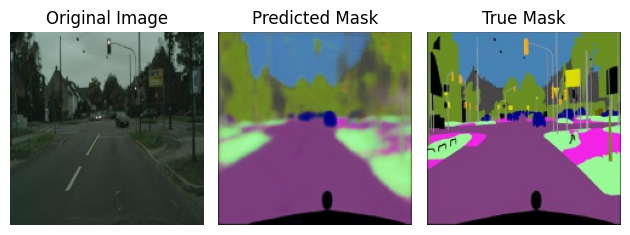

91/91 [==============================] - 16s 174ms/step - loss: 0.5483 - accuracy: 0.6584 - mean_io_u: 0.5000 - val_loss: 0.5752 - val_accuracy: 0.5753 - val_mean_io_u: 0.5000
Epoch 22/50
1/1 [==============================] - 0s 50ms/step


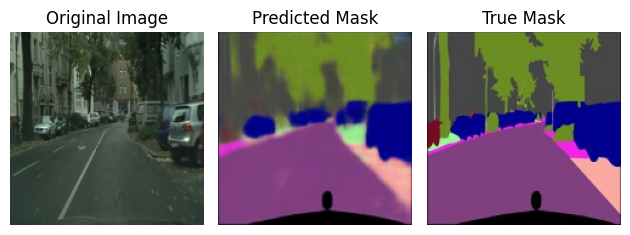

91/91 [==============================] - 16s 180ms/step - loss: 0.5473 - accuracy: 0.6556 - mean_io_u: 0.5000 - val_loss: 0.5730 - val_accuracy: 0.6646 - val_mean_io_u: 0.5000
Epoch 23/50
1/1 [==============================] - 0s 39ms/step


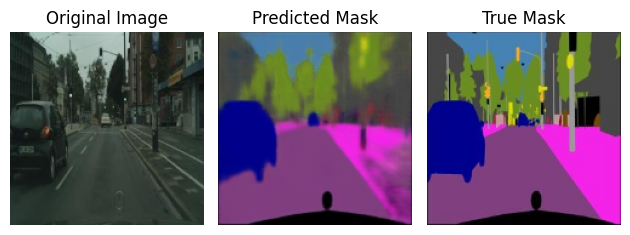

91/91 [==============================] - 16s 174ms/step - loss: 0.5464 - accuracy: 0.6540 - mean_io_u: 0.5000 - val_loss: 0.5755 - val_accuracy: 0.6897 - val_mean_io_u: 0.5000
Epoch 24/50
1/1 [==============================] - 0s 21ms/step


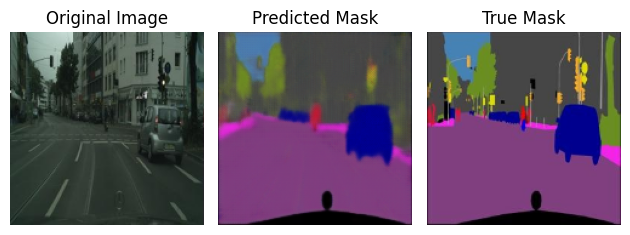

91/91 [==============================] - 16s 171ms/step - loss: 0.5458 - accuracy: 0.6629 - mean_io_u: 0.5000 - val_loss: 0.5760 - val_accuracy: 0.6490 - val_mean_io_u: 0.5000
Epoch 25/50
1/1 [==============================] - 0s 21ms/step


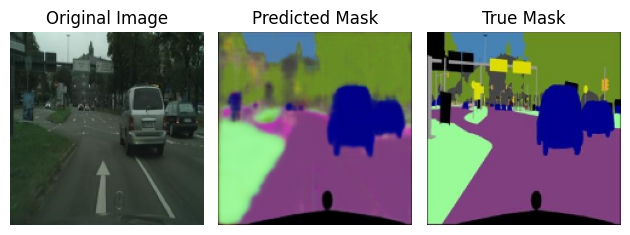

91/91 [==============================] - 16s 172ms/step - loss: 0.5454 - accuracy: 0.6563 - mean_io_u: 0.5000 - val_loss: 0.5733 - val_accuracy: 0.6340 - val_mean_io_u: 0.5000
Epoch 26/50
1/1 [==============================] - 0s 23ms/step


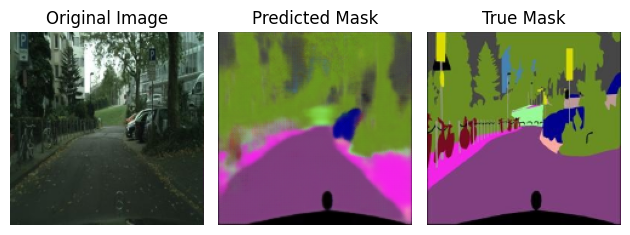

91/91 [==============================] - 16s 171ms/step - loss: 0.5448 - accuracy: 0.6605 - mean_io_u: 0.5000 - val_loss: 0.5743 - val_accuracy: 0.6962 - val_mean_io_u: 0.5000
Epoch 27/50
1/1 [==============================] - 0s 21ms/step


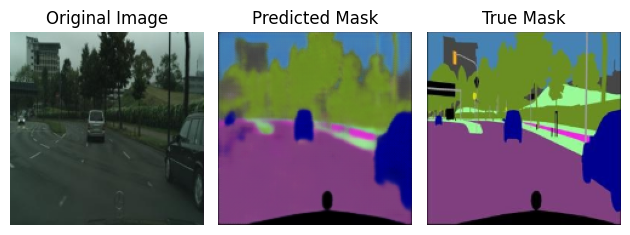

91/91 [==============================] - 16s 173ms/step - loss: 0.5440 - accuracy: 0.6628 - mean_io_u: 0.5000 - val_loss: 0.5741 - val_accuracy: 0.6956 - val_mean_io_u: 0.5000


In [ ]:
LinknetModel.fit(
        X_train, y_train,
        validation_data=(X_valid, y_valid),
        epochs=50,
        callbacks=callbacks
    )


In [ ]:
path = '/content/drive/MyDrive/Cityscapes_dataset/cityscapes_data/val/'
image_paths = sorted(glob(path + "*.jpg"))
SIZE = 160
images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

for i in tqdm(range(len(image_paths))):
    path = image_paths[i]
    image = cv.imread(path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    image = img_to_array(image).astype('float')
    img = image[:,:256,:]/255.0
    img = tf.image.resize(img,(SIZE, SIZE))
    mask = image[:,256:,:]/255.0
    mask = tf.image.resize(mask,(SIZE, SIZE))
    images[i] = img
    masks[i] = mask

100%|██████████| 500/500 [00:06<00:00, 75.32it/s]


In [ ]:
def show_image(image,title=None):
    plt.imshow(image)
    if title is not None: plt.title(title)
    plt.axis('off')

1/1 [==============================] - 0s 26ms/step


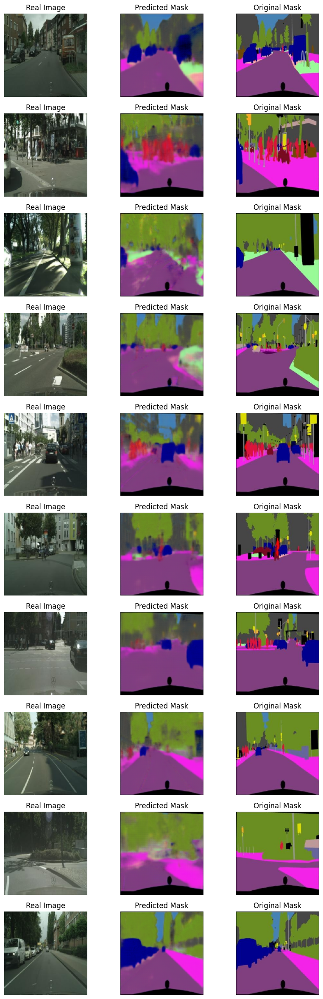

In [ ]:
plt.figure(figsize=(10,30))
n=0
for i in range(1,31):
    plt.subplot(10,3,i)
    if n==0:
        id = np.random.randint(len(images))
        real_img = images[id][np.newaxis,...]
        pred_mask = LinknetModel.predict(real_img)[0]
        mask = masks[id]
        show_image(real_img[0], title="Real Image")
        n+=1
    elif n==1:
        show_image(pred_mask, title="Predicted Mask")
        n+=1
    elif n==2:
        show_image(mask, title="Original Mask")
        n=0
plt.show()

#Ứng dụng